# Advanced Lane Finding
----
The challenge in this project is to create a improved lane finding algorithm, using computer vision techniques.

The following are the main goals of this project:
- Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
- Apply the distortion correction to the raw image.
- Use color transforms, gradients, etc., to create a thresholded binary image.
- Apply a perspective transform to rectify binary image (“birds-eye view”).
- Detect lane pixels and fit to find lane boundary.
- Determine curvature of the lane and vehicle position with respect to center.
- Warping the detected lane boundaries back onto the original image.
- Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.
- Run the entire pipeline on a sample video recorded on a sunny day on the I-280.

# Import the required packages
----

In [1]:
import numpy as np
import cv2
import glob
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

## Define the image path
OUT_IMG_DIR ="./output_images/"

## setting camera calibration image path
CAM_IMG_PATH = "./camera_cal/"

## setting testimage path
TST_IMG_PATH = "./test_images/"

# The Pipeline
-----
Overall, my pipeline looks like the following:

![Project Pipeline](output_images/project_pipeline.png?raw=true "pipeline")


1. Camera calibration
2. Distortion correction
3. Color/gradient threshold
4. Perspective transform
5. Detect lane lines
6. Determine the lane curvature
7. Draw lines

## Step 1 : Camera Calibration
----

Real cameras use curved lenses to form an image, and light rays often bend a little too much or too little at the edges of these lenses. This creates an effect that distorts the edges of images, so that lines or objects appear more or less curved than they actually are. This is called radial distortion, which is the most common type of distortion.

There are three coefficients needed to correct radial distortion: k1, k2, and k3. To correct the appearance of radially distorted points in an image, one can use a correction formula mentioned below.

![Calibration](output_images/calibration_explian.png?raw=true "Calibration")
![Calibration correction](output_images/cal_radial_formulae.png?raw=true "Calibration corrrection")


In the following equations, (x,y) is a point in a distorted image. To undistort these points, OpenCV calculates r, which is the known distance between a point in an undistorted (corrected) image (xcorrected ,ycorrected) and the center of the image distortion, which is often the center of that image (xc ,yc ). This center point (xc ,yc) is sometimes referred to as the distortion center. These points are pictured above.

The calibrate_camera function performs following operation:
1. Read the chessboad images and convert to gray scale`cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)` 
2. Find the chessboard corners using `cv2.calibrateCamera()`
    I start by preparing object points, which will be the (x, y, z) coordinates of the chessboard corners in the world. Here I am assuming the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image. Thus, objp is just a replicated array of coordinates, and objpoints will be appended with a copy of it every time I successfully detect all chessboard corners in a test image. imgpoints will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.
3. Performs the `cv2.calibrateCamera()` to compute the distortion co-efficients and camera matrix that we need to transform the 3d object points to 2d image points.

4. Store the calibration values in the camera_cal/camera_cal_img_3.p file to use it later.

The get_mtx_dist() function is to read the calibration values from the camera_cal/camera_cal.p file.

For this project we used the 20 chessboard calibration images provided by Udacity in the directory `camera_cal`. Object points were generated in code assuming 9 internal corners in the horizontal direction and 6 in the vertical direction in every image.

Calibrating camera...


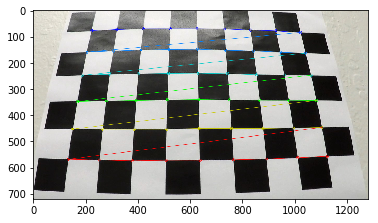

In [2]:
## Compute the camera calibration matrix and distortion coefficients given a set of chessboard images
def calibrate_camera(files):
    print("Calibrating camera...")
    images = glob.glob(files)

    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2S points in image plane

    # Prepare objpoints like (0,0,0), (1,0,0), ... (7,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Read in images and find chessboard corners
    for fname in images:
        # Read in 
        img = mpimg.imread(fname)
        
        # get image size
        img_size = (img.shape[1], img.shape[0])
        #print(fname +' : '+ str(img_size))
        
        # Convert image to gray
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If corners are found, add object points, image points
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)

            # draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            plt.imshow(img)
           
            
        else:
            print("    Warning: Could not find correct number of corners for image {}".format(fname))
    
        
    
    # Get camera calibration params
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    #save the calibration data in a pickle file to use later
    camera_cal_val = CAM_IMG_PATH + "camera_cal_img_3.p" 
    output = open(camera_cal_val, 'wb')

    mydict2 = {'mtx': 1, 'dist': 2}
    mydict2['mtx'] = mtx
    mydict2['dist'] = dist
    pickle.dump(mydict2, output)
    output.close()
 

# First lets calibrate the camera
calibrate_camera(CAM_IMG_PATH + "calibration3.jpg")

## Step 2: Distortion Correction
----
Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images, is to undo this distortion so that you can get correct and useful information out of them.


Why is it important to correct for image distortion?
- Distortion can change the appearant size of an object in an image
- Distortion can change the appearant shape of an object in an image
- Distortion can cause an object's appearance to chnage depedning on where it is in the filed of view. 
- Distortion can make an object appear closer or farther away than actually they are

 There are two main steps to this process: 
- use chessboard images to obtain image points and object points 
- then use the OpenCV functions to compute the calibration and undistortion
    * `cv2.calibrateCamera()`  
    * `cv2.undistort()` 

First, I defined  then "object points", which represent the (x, y, z) coordinates of the chessboard corners in the real world. I assumed that the chessboard is fixed on the (x, y) plane at z=0, such that the object points are the same for each calibration image. Thus, objp is just a replicated array of coordinates, and objpoints is appended with a copy of it every time I successfully detect all chessboard corners in a test image. 

imgpoints is appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.

test_images  20
test_images  6


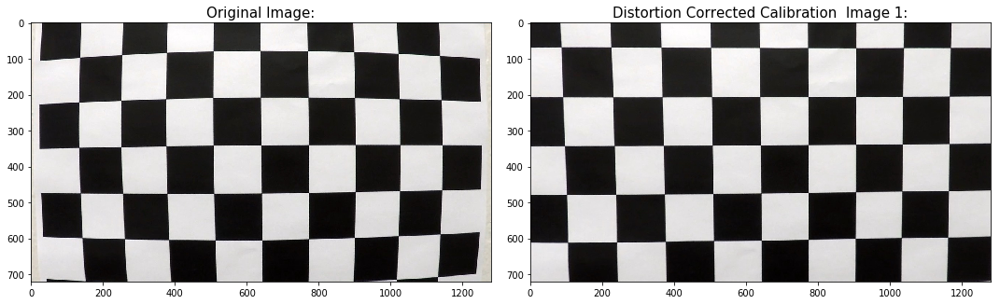

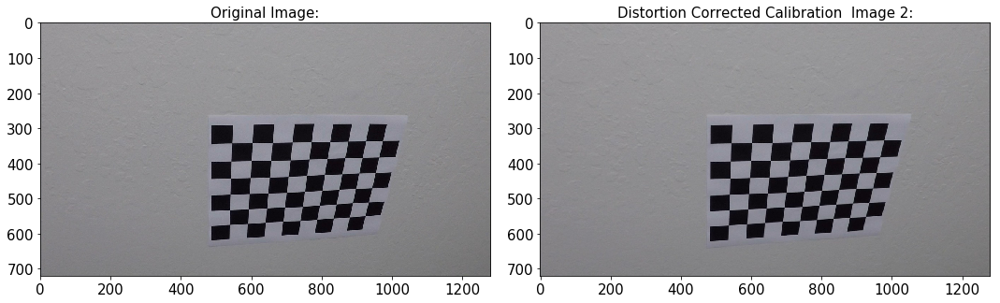

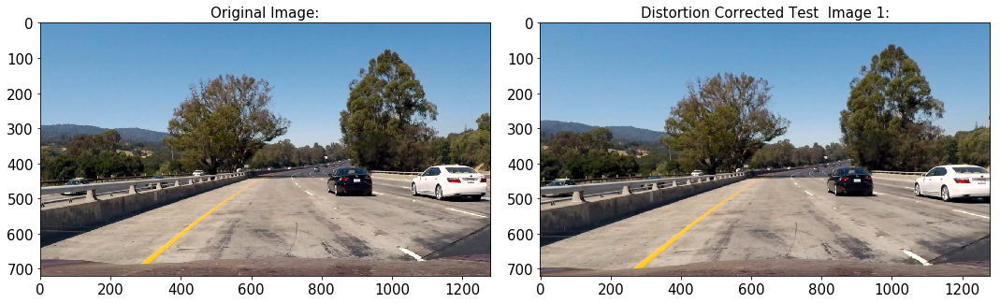

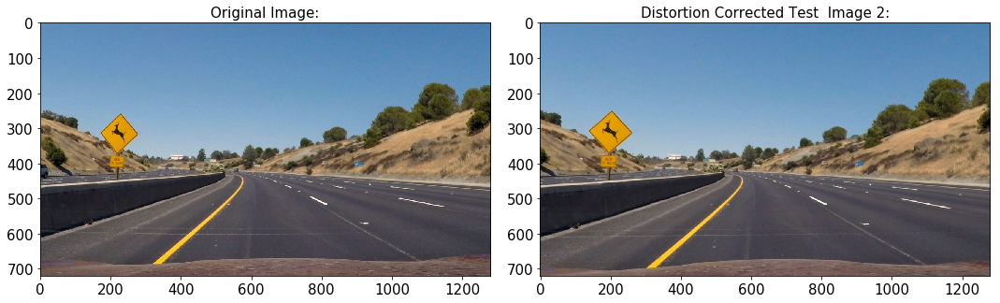

In [3]:
def plotter(test_img, new_img, plot_title=None, n=0):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,9))
    f.tight_layout()
    matplotlib.rc('xtick', labelsize=15) 
    matplotlib.rc('ytick', labelsize=15)
    ax1.imshow(test_img)
    ax1.set_title('Original Image:', fontsize=15)
    ax2.imshow(new_img, cmap='gray')
    ax2.set_title('{0}  Image {1}:'.format(plot_title, n+1), fontsize=15)
    
def get_mtx_dist(pickle_file):
    dist_pickle = pickle.load( open( pickle_file, "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    return mtx, dist

   
def undistort_images(img_path, op):
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        plotter(test_img, cv2.cvtColor(new_img, cv2.COLOR_BGR2RGB), op, n)
        plt.savefig(OUT_IMG_DIR + 'undistorted.png'.format(op), bbox_inches="tight")
        
        n += 1
        if n==2:
            break
         

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Un-distort test calibration image as demo that calibration is correct
img_path = CAM_IMG_PATH + "calibration*.jpg"
undistort_images(img_path, 'Distortion Corrected Calibration')


# Un-distort test image as demo that calibration is correct
img_path = TST_IMG_PATH + 'test*.jpg'    
undistort_images(img_path, 'Distortion Corrected Test')  


## Step 3: Binary Thresholding
----

The Thresholding stage is where we process the undistorted image and attempt to mask out which pixels are part of the lanes and remove those that are not. This sounds far easier than it actually is.
I have a mini-pipeline for this stage which looks like the following:

![Binary Thresholding Pipeline](output_images/BinaryThresholdingPipeline.png?raw=true "Binary Thresholding Pipeline")

I took the input RGB image, and in the top path, I convert it to grayscale. I then applied a Sobel filter in the X direction to get image edges that match the direction of the lane lines. I then apply a threshold function on this to filter out out pixels that are not of interest. Through experiments, I found that min/max threshold values of 30 and 150 seem to work well. I use this output to generate a binary image of pixels of interest.

On the bottom path, I convert the RGB image to the HLS color space, and then use the S channel from that. The S saturation channel is useful for picking out lane lines under different color and contrast conditions, such as shadows. I then pass the S channel into an InRange function, again to filter out pixels that are not of interest. Through experiments, I found values of 175 and 250 to work best here. I also generate a binary image using this output.

### Sobel Filter Thresholding
Applying the Sobel operator to an image is a way of taking the derivative of the image in the x or y direction.
The Goal here is to identify pixels where the gradient of an image falls within a specified threshold range.

test_images  6


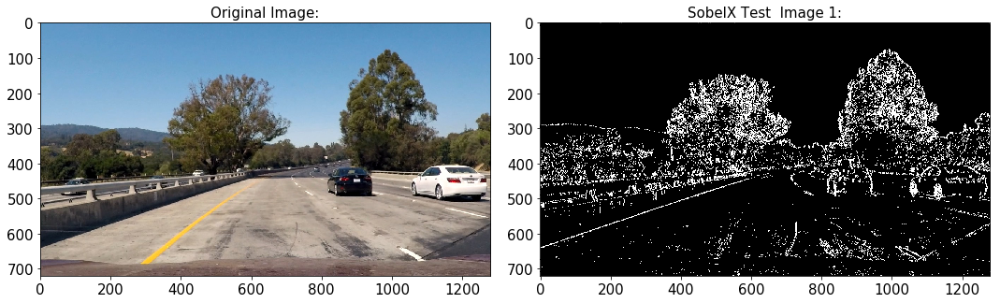

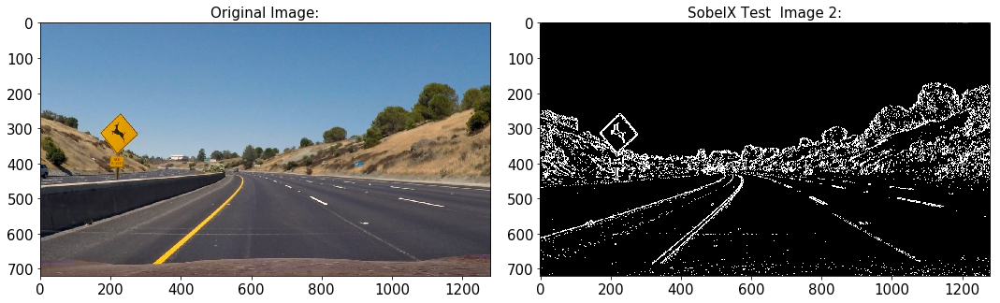

In [4]:
def sobel_x(img, threshold_MIN=15, threshold_MAX=255):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= threshold_MIN) & (scaled_sobel <= threshold_MAX)] = 1
    return binary_output
                   
def sobelX(img_path, op):   
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = sobel_x(img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'sobel_x.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")


# Test the sobelX on test images
img_path = TST_IMG_PATH + 'test*.jpg'    
sobelX(img_path,'SobelX Test')

# Test the sobelY on Challenge images
#img_path = TST_IMG_PATH + "challenge*.png"
#sobelX(img_path, 'sobelX Challenge')


It seems like the x-axis definitely performs better for this task. It makes sense because the lane lines are typically vertical lines and the x-axis direction of the sobel filter highlights vertical lines (versus the y-axis direction highlights many of the horizontal elements of the image).

While in the example above the lane lines are pretty clearly identified, if we look at a harder example the result is not as clean.

Note that in the top example, we almost completely do not see the yellow lane line. Rather we capture the different colored pavement. In the bottom example, we also mainly capture the different pavement transition.

We can try to use other thresholding techniques (using color spaces) to identify the lane line even in situations where the we have anomalous aspects in the input image. 

test_images  6


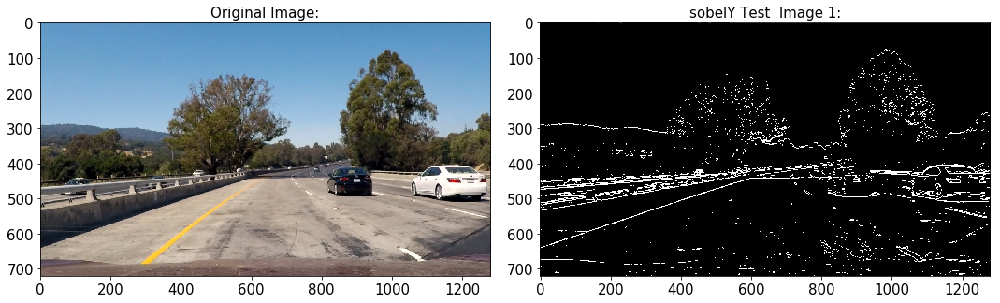

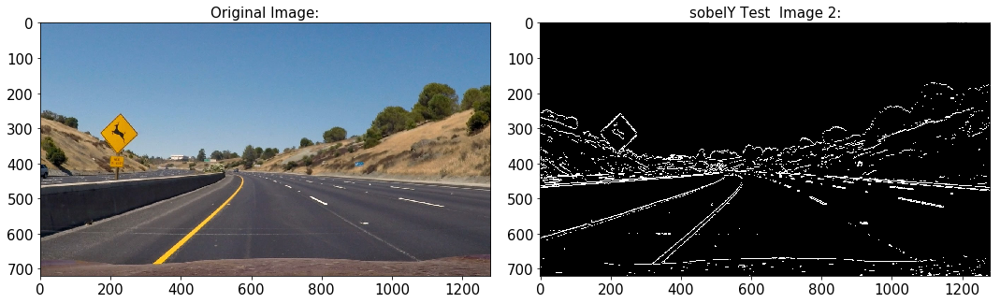

In [5]:
def sobel_y(img, threshold_MIN=35, threshold_MAX=255):  
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= threshold_MIN) & (scaled_sobel <= threshold_MAX)] = 1
    return binary_output

def sobelY(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = sobel_y(img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'sobel_y.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break
        

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test the sobelY on test images
img_path = TST_IMG_PATH + 'test*.jpg'    
sobelY(img_path, 'sobelY Test')  

# Test the sobelY on Challenge images
#img_path = TST_IMG_PATH + "challenge*.png"
#sobelY(img_path, 'sobelY Challenge')

### Magnitude of Gradient Thresholding
The goal here is to apply a threshold to the overall magnitude of the gradient, in both x and y.The magnitude, or absolute value, of the gradient is just the square root of the squares of the individual x and y gradients.

Important Factors - 
- the size of the region in the image over which you'll be taking the gradient. You can modify the kernel size for the Sobel operator to change the size of this region. Taking the gradient over larger regions can smooth over noisy intensity fluctuations on small scales. 

- the kernel size should be an odd number. Since we are searching for the gradient around a given pixel, we want to have an equal number of pixels in each direction of the region from this central pixel, leading to an odd-numbered filter size - a filter of size three has the central pixel with one additional pixel in each direction, while a filter of size five has an additional two pixels outward from the central pixel in each direction.

The function `gradientMagnitude` 
- Takes in an image and optional Sobel kernel size, as well as thresholds for gradient magnitude. 
- Next, it compute gradient magnitude, apply a threshold, and create a binary output image showing where thresholds were met.

test_images  6


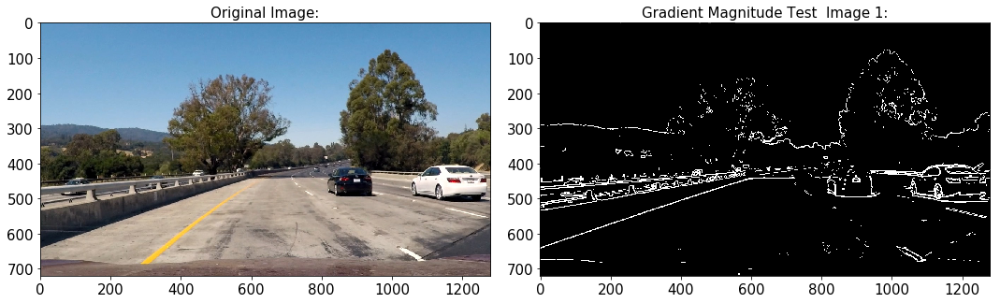

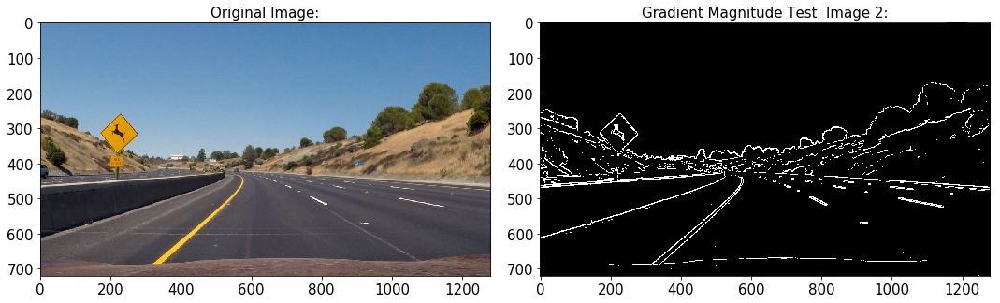

In [6]:
def gradientMagnitude(img, sobel_kernel=7, mag_threshold=(60, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    gradmag = np.sqrt(sobel_x**2 + sobel_y**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_threshold[0]) & (gradmag <= mag_threshold[1])] = 1
    return binary_output



def gradient_magnitude(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = gradientMagnitude(img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'gradient_magnitude.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break

 # get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# test the gradient magnitude on test images            
img_path = TST_IMG_PATH + 'test*.jpg'    
gradient_magnitude(img_path, 'Gradient Magnitude Test')

# test the gradient magnitude on Challenge images 
#img_path = TST_IMG_PATH + 'challenge*.png'    
#gradient_magnitude(img_path, 'Gradient Magnitude Challenge')


### Direction of Gradient Thresholding
As you notice above that gradient magnitude picks up the lane lines well, but with a lot of other stuff detected too. Gradient magnitude is at the heart of Canny edge detection, and is why Canny works well for picking up all edges.

In the case of lane lines, we're interested only in edges of a particular orientation. So now we will explore the direction, or orientation, of the gradient. The direction of the gradient is simply the inverse tangent (arctangent) of the y gradient divided by the x gradient

The function `gradientDirection(img, sobel_kernel=9, thresh=(0.7, 1.1))` compute the direction of the gradient and apply a threshold. The direction of the gradient is much noisier than the gradient magnitude, but the function pick out particular features by orientation.


test_images  6


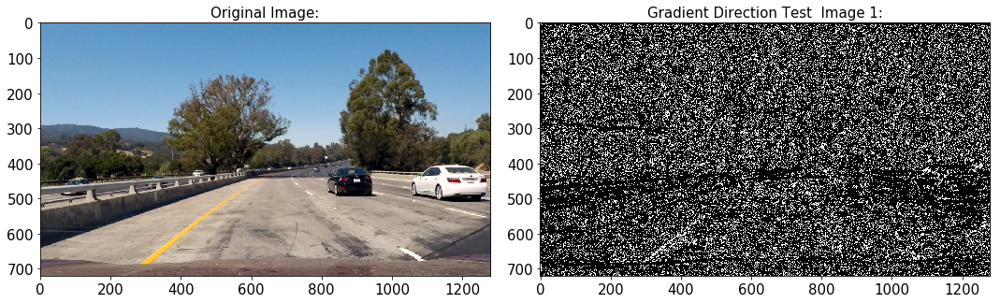

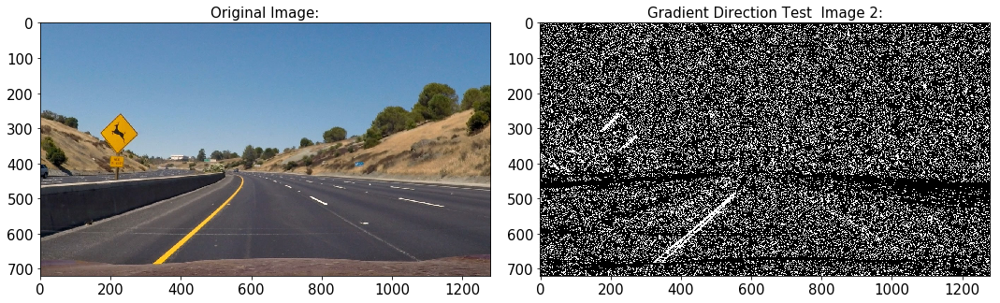

In [7]:
def gradientDirection(img, sobel_kernel=9, thresh=(0.7, 1.1)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_grad_dir = np.arctan2(np.absolute(sobel_y), np.absolute(sobel_x))
    binary_output =  np.zeros_like(abs_grad_dir)
    binary_output[(abs_grad_dir >= thresh[0]) & (abs_grad_dir <= thresh[1])] = 1
    return binary_output


def gradient_direction(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = gradientDirection(img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'gradient_direction.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break            
            
# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# test the gradient Direction on test images  
img_path = TST_IMG_PATH + 'test*.jpg'    
gradient_direction(img_path,'Gradient Direction Test')

# test the gradient Direction on challenge images 
#img_path = TST_IMG_PATH + 'challenge*.png'    
#gradient_direction(img_path,'Gradient Direction Challenge')

### HLS and Color Thresholding
A color space is a specific organization of colors; color spaces provide a way to categorize colors and represent them in digital images. You can think of color space as a 3D space, where any color can be represented by a 3D coordinates values. 

Below are some of the most commonly used color spaces in image analysis.
* RGB color space (red-green-blue)
* HSV color space (hue, saturation, and value), and 
* HLS space (hue, lightness, and saturation). 

In the code below, I used HLS space to help detect lane lines of different colors and under different lighting conditions.

OpenCV provides a function `hls = cv2.cvtColor(im, cv2.COLOR_RGB2HLS)` that converts images from one color space to another. It convert one color at a time from RGB to HLS.

test_images  6


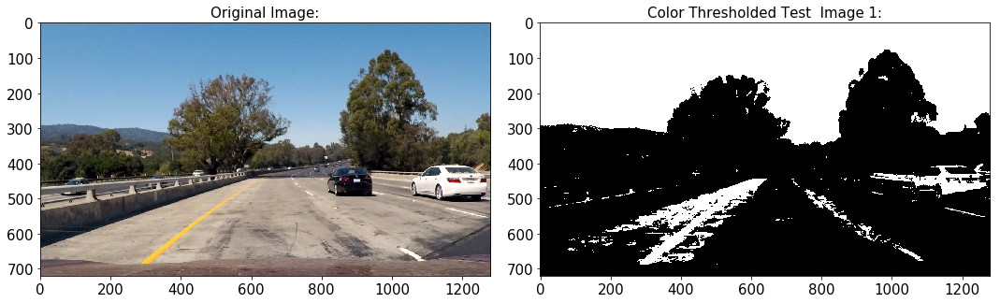

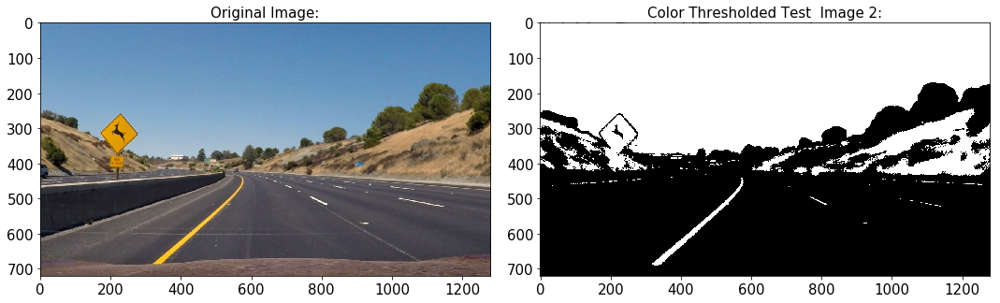

In [8]:
def colorThresholds(img, HLS_s_threshold=(60, 255), HSV_v_threshold=(120,255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > HLS_s_threshold[0]) & (s_channel <= HLS_s_threshold[1])] = 1
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel > HSV_v_threshold[0]) & (v_channel <= HSV_v_threshold[1])] = 1  
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_binary == 1) & (v_binary == 1)] = 1
    return binary_output


def color_thresholds(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = colorThresholds(img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'color_thresholds.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test the color_thresholds on test images
img_path = TST_IMG_PATH + 'test*.jpg'    
color_thresholds(img_path, 'Color Thresholded Test')

# Test the color_thresholds on challenge images 
#mg_path = TST_IMG_PATH + 'challenge*.png'    
#color_thresholds(img_path,'Color Thresholded challenge')                            

## Combine thresholding
As you notice, you can start to identify the lane lines by gradient direction alone by setting the threshold around thresh = (0.7, 1.3), but there's still a lot of noise in the resulting image.

Now consider how you can use various aspects of your gradient measurements (x, y, magnitude, direction) to isolate lane-line pixels. Specifically, think about how you can use thresholds of the x and y gradients, the overall gradient magnitude, and the gradient direction to focus on pixels that are likely to be part of the lane lines.

Combine thresholding is different combinations of gradient magnitude and direction.

test_images  6


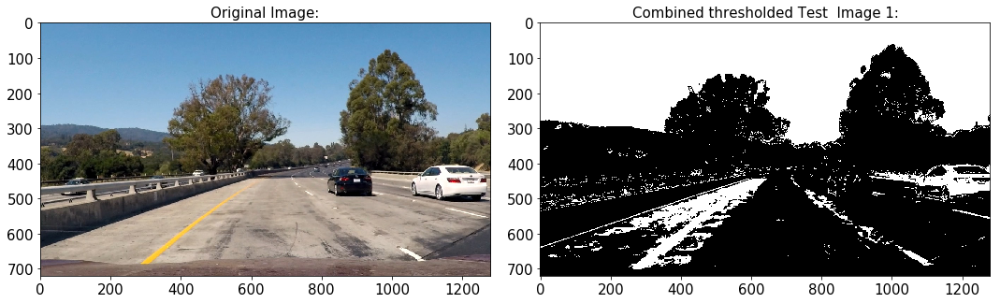

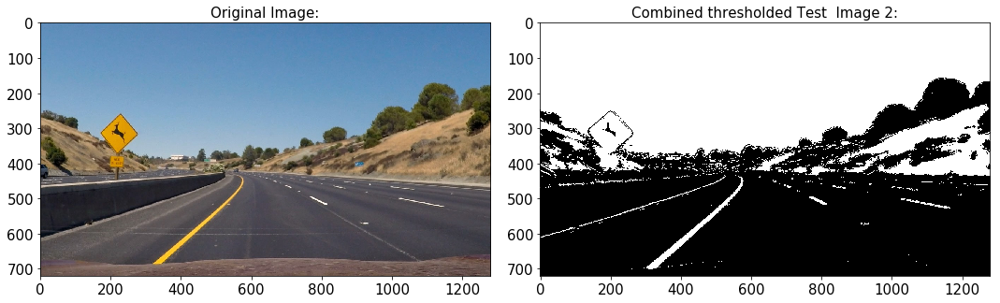

In [9]:
def combinedThresholds(img):
    binary_x = sobel_x(img)
    binary_y = sobel_y(img)
    mag = gradientMagnitude(img)
    direct = gradientDirection(img)
    color = colorThresholds(img)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    binary_output = np.zeros_like(img)
    #binary_output[color == 1] = 1
    binary_output[(binary_x == 1) & (binary_y == 1) & (mag == 1) | (color == 1) | (mag == 1) & (direct == 1)] = 1
    return binary_output

def combined_thresholds(img_path, op):
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img) 
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'thresholded_binary.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break
# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

#  Test combined_thresholds on test images
img_path = TST_IMG_PATH + 'test*.jpg'    
combined_thresholds(img_path, 'Combined thresholded Test')

#  Test combined_thresholds on challenge images
#img_path = TST_IMG_PATH + 'challenge*.png'    
#combined_thresholds(img_path,'Combined thresholded challenge') 

Taking a look at the above output, it seems like the combined thresholding does relatively well on the simple examples, but there are still difficulties with the challenge images. Note that the noise in the rest of the image will be masked away later so we can just aim to better highlight the lane lines using color thresholding.

## Step 4: Perspective Transform
----
Once I have the binary threshold images above, I applied a perspective transform on the image to generate an image with the effect of looking down on the road from above. 

A perspective transform maps the points in a given image to different, desired, image points with a new perspective. The perspective transform you’ll be most interested in is a bird’s-eye view transform that let’s us view a lane from above; this will be useful for calculating the lane curvature later on. Aside from creating a bird’s eye view representation of an image, a perspective transform can also be used for all kinds of different view points.

To calculate the perspective transform and apply the persepective transforms I used below openCV functions
* `cv2.getPerspectiveTransform()` to calculates a perspective transform from four pairs of the corresponding points
* `cv2.warpPerspective()` to apply a perspective transformation to an image to get a top-down view

test_images  6


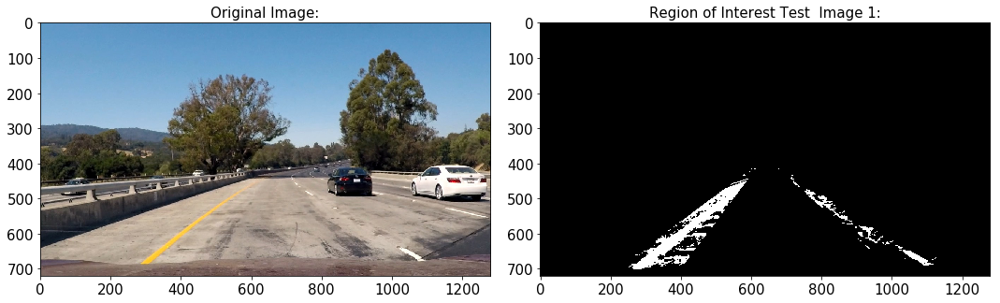

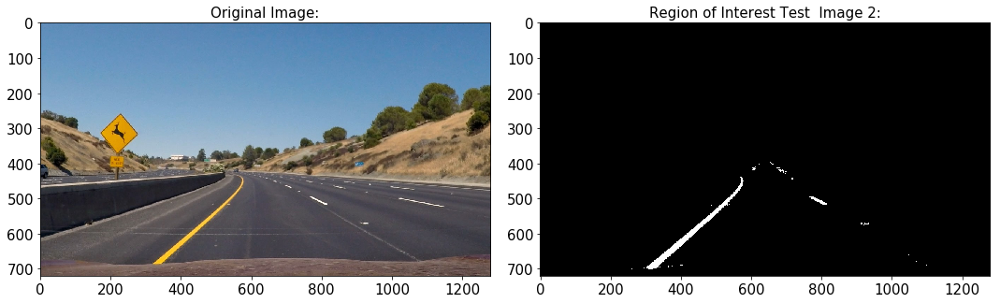

In [10]:
# Region Of Interest
def region_of_interest_left(img):
    width = img.shape[1]
    height = img.shape[0]
    vertices = np.array([[(width*0.49, height*0.55),
                        (width*0.49, height*0.55),
                        (width*0.3, height),
                        (width*0.15, height)]], 
                        dtype=np.int32)
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image_left = cv2.bitwise_and(img, mask)
    return masked_image_left

def region_of_interest_right(img):
    width = img.shape[1]
    height = img.shape[0]
    vertices = np.array([[(width*0.51, height*0.55),
                        (width*0.51, height*0.55),
                        (width*0.95, height),
                        (width*0.8, height)]], 
                        dtype=np.int32)
    mask = np.zeros_like(img)   
    if len(img.shape) > 2:
        channel_count = img.shape[2]
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    masked_image_right = cv2.bitwise_and(img, mask)
    return masked_image_right

def region_of_interest(img):
    mask_left = region_of_interest_left(img)
    mask_right = region_of_interest_right(img)
    masked_image = cv2.addWeighted(mask_left, 1.0, mask_right, 1.0, 0)
    return masked_image


def  regionOfInterest(img_path,op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img = region_of_interest(new_img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'region_masked.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

#  Test regionOfInterest on test images            
img_path = TST_IMG_PATH + 'test*.jpg'    
regionOfInterest(img_path, 'Region of Interest Test')

#  Test regionOfInterest on challenge images   
#img_path = TST_IMG_PATH + 'challenge*.png'    
#regionOfInterest(img_path, 'Region of Interest challenge') 

test_images  6


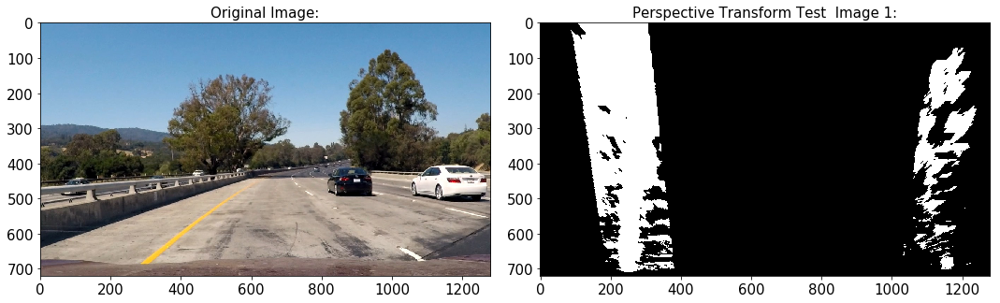

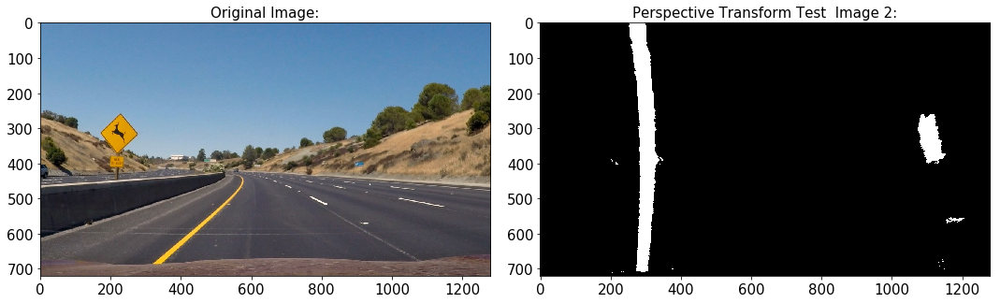

In [11]:
## Apply a perspective transform to rectify binary image ("birds-eye view")
def transform_perspective(img):
    width = img.shape[1]
    height = img.shape[0]
    src = np.array([[(width*0.4, height*0.65),
                        (width*0.6, height*0.65),
                        (width, height),
                        (0, height)]], 
                        dtype=np.float32)
    dst = np.array([[0,0], 
                    [img.shape[1], 0], 
                    [img.shape[1], img.shape[0]],
                    [0, img.shape[0]]],
                    dtype = 'float32')
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped_output = cv2.warpPerspective(img, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    return warped_output, M, Minv

def transformPerspective(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img = region_of_interest(new_img)
        new_img, M, Minv = transform_perspective(new_img)
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'perspective_transform.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break
 
# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test transformPerspective on test images  
img_path = TST_IMG_PATH + 'test*.jpg'    
transformPerspective(img_path, 'Perspective Transform Test')

# Test transformPerspective on challenge images  
#img_path = TST_IMG_PATH + 'challenge*.png'    
#transformPerspective(img_path, , 'Perspective Transform Challenge') 

After I have applied the perspective transform to the binary threshold image, I get an image that looks that lanes from above, similar to the below.

## Step 5: Locate Lanes
----
This stage is where we will try to extract the actual lane pixels for both the left and right lanes from the above image.

For the first frame from a camera, or for cases where we lanes are ‘lost’ (i.e. we have not been able to reliably detect a ‘good’ lane for a number of frames), I generate a histogram of the bottom half of the image. Then using the two peaks in this histogram, I determine a good starting point to start
searching for image pixels at the bottom of the image. Let’s call these points x_left and x_right.

Once these points are calculated, I divide the image into 10 horizontal strips of equal size. For the bottom strip, I mask out everything outside of a small window around x_left and x_right in order to extract the pixels that belong to the lane, effectively discarded all other ‘noise’ pixels.

I repeat this process for each strip, using histograms on the strips to determine good x_left and x_right values. Once I have processed all strips, I then am left with images for both the left and right lanes.

In [12]:
## Locate lane pixels and fit to find the lane boundary
class Line():
    
    def __init__(self):
        
        self.detected = False
        
        self.recent_xfits = []
        self.best_xfit = None
        
        self.current_fit_coeffs = [np.array([False])]
        self.best_fit_coeffs = None
                
        self.radius_of_curvature = None
        self.line_base_position = None
        
        self.allx = None
        self.ally = None
        
def verify_lane_width(left, right):
    print(left-right)
    if np.absolute(left - right) > 1100 | np.absolute(left - right) < 900:
        return True
    else:
        return False
    
def annotate(img, left_curverad, right_curverad, camera):
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    cv2.putText(img, 'Left Radius of Curvature: {0:6f} meters'.format(left_curverad), (10,30), font, 1, (255,255,255), 2)
    cv2.putText(img, 'Right Radius of Curvature: {0:6f} meters'.format(right_curverad),(10,60), font, 1, (255,255,255), 2)
    cv2.putText(img, 'Camera Offset: {0:6f} meters'.format(camera), (10,90), font, 1, (255,255,255), 2)

### Sliding Window Search and Polynomial Line Fitting
Next we can try to figure out where the lane lines are and how much curvature are in the lane lines. In order to find the lane lines, we can create a histogram with the columns of the image intensities summed together. This would return higher values for areas where there are higher intensities (lane lines).

test_images  6


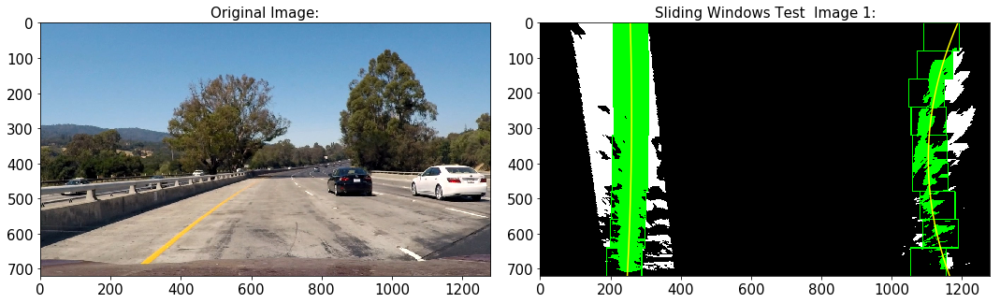

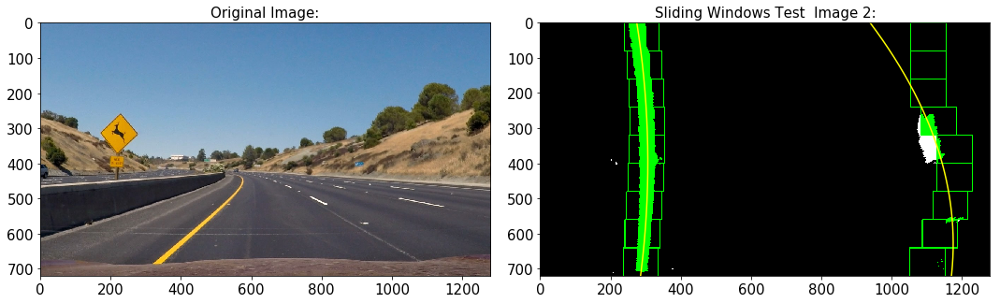

In [13]:
LEFT = Line()
RIGHT = Line()

def sliding_windows(binary_warped):
    
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    nwindows = 9
    window_height = np.int(binary_warped.shape[0]/nwindows)
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    leftx_current = leftx_base
    rightx_current = rightx_base
    margin = 50
    minpix = 1
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(nwindows):
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [0, 255, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 255, 0]
    
    #For Video:
    LEFT.recent_xfits = [(left_fitx)]
    LEFT.best_xfit = np.mean(LEFT.recent_xfits)
    RIGHT.recent_xfits = [(right_fitx)]
    RIGHT.best_xfit = np.mean(RIGHT.recent_xfits)
        
    LEFT.current_fit_coeffs = [(left_fit)]
    LEFT.best_fit_coeffs = np.mean(LEFT.current_fit_coeffs)
    RIGHT.current_fit_coeffs = [(right_fit)]
    RIGHT.best_fit_coeffs = np.mean(RIGHT.current_fit_coeffs)
    
    LEFT.line_base_position = leftx_current
    RIGHT.line_base_position = rightx_current
    
    LEFT.allx = leftx
    LEFT.ally = lefty
    RIGHT.allx = rightx
    RIGHT.ally = righty
    
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base

def slidingWindows(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img = region_of_interest(new_img)
        new_img, M, Minv = transform_perspective(new_img)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img)
        plotter(test_img, windows_img, op, n)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.savefig(OUT_IMG_DIR + 'sliding_windows.png'.format(op), bbox_inches="tight")
        n += 1
        if n==2:
            break

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test slidingWindows on test images  
img_path = TST_IMG_PATH + 'test*.jpg'    
slidingWindows(img_path, 'Sliding Windows Test')


### Fitting Shaded Lines

test_images  6


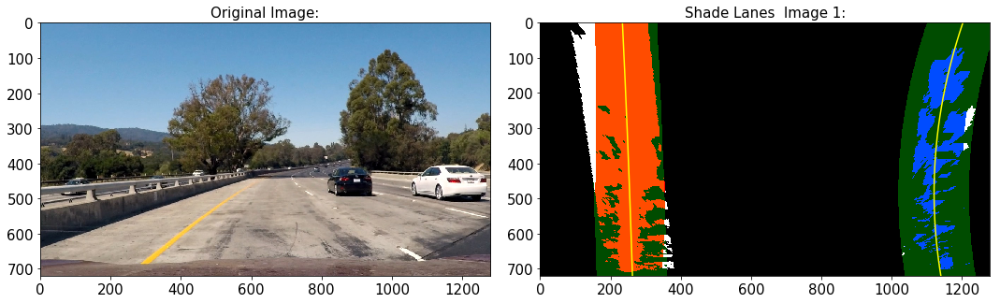

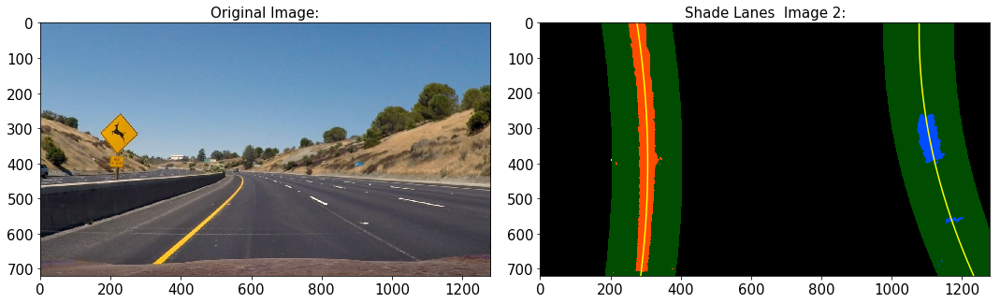

In [14]:
def shaded_lanes(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    if left_fitx.all() != 0:
        LEFT.detected == True
    else:
        LEFT.detected == False
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    if right_fitx.all() != 0:
        RIGHT.detected == True
    else:
        RIGHT.detected == False
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    return out_img, ploty, left_fitx, right_fitx, left_fit, right_fit

def shadedLanes(img_path,op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img = region_of_interest(new_img)
        new_img, M, Minv = transform_perspective(new_img)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img)
        shades_img, ploty, left_fitx, right_fitx,left_fit, right_fit = shaded_lanes(new_img, left_fit, right_fit)
        plotter(test_img, shades_img, op, n)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        plt.savefig(OUT_IMG_DIR + 'shaded_lanes.png'.format(op), bbox_inches="tight")
        
        n += 1
        if n==2:
            break

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test shadedLanes on test images              
img_path = TST_IMG_PATH + 'test*.jpg'    
shadedLanes(img_path, 'Shade Lanes')

In the above example, we can see that the lane lines are quite well defined and the fitted line is also quite accurate! Next, we define a new function that can take in the fit of the last frame (of a video, if there is one) and search only in an area that is close to the previous image's lane lines.

## Step 6: Determining Lane Curvature & Warping to Original Image
----

In [15]:
## Determine the curvature of the lane
def roc_in_pixels(ploty, left_fit, right_fit, leftx, rightx):
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    return left_curverad, right_curverad
        
def radiusOfCurvature(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img, M, Minv = transform_perspective(new_img)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx,leftx_base, rightx_base = sliding_windows(new_img)
        left_curverad, right_curverad = roc_in_pixels(ploty, left_fit, right_fit, leftx, rightx)
        print(OUT_IMG_DIR + 'Test Image {0}\nLeft Radius of Curvature: {1:2f} pixels\nRight Radius of Curvature: {2:2f} pixels\n'.format(n+1, left_curverad, right_curverad))
        n += 1

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test radiusOfCurvature on test images 
img_path = TST_IMG_PATH + 'test*.jpg'    
radiusOfCurvature(img_path, 'Radius of Curvature Test')

test_images  6
./output_images/Test Image 1
Left Radius of Curvature: 8598.589955 pixels
Right Radius of Curvature: 1043.128913 pixels

./output_images/Test Image 2
Left Radius of Curvature: 2569.221597 pixels
Right Radius of Curvature: 5177.963706 pixels

./output_images/Test Image 3
Left Radius of Curvature: 12397.838429 pixels
Right Radius of Curvature: 2824.754859 pixels

./output_images/Test Image 4
Left Radius of Curvature: 6091.692407 pixels
Right Radius of Curvature: 2297.405152 pixels

./output_images/Test Image 5
Left Radius of Curvature: 2944.919504 pixels
Right Radius of Curvature: 4505.052710 pixels

./output_images/Test Image 6
Left Radius of Curvature: 6720.150913 pixels
Right Radius of Curvature: 51563.838071 pixels



### Convert pixels space to meters in x and y  

In [16]:
def roc_in_meters(ploty, left_fit, right_fit, leftx, rightx):
    
    ym_per_pix = 30/550
    xm_per_pix = 3.5/1000
    y_eval = np.max(ploty)
    leftx = np.array(leftx, dtype=np.float32)
    rightx = np.array(rightx, dtype=np.float32)
    left_fit_cr = np.polyfit(leftx*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(rightx*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #For Video:
    
    LEFT.radius_of_curvature = left_curverad
    RIGHT.radius_of_curvature = right_curverad
    
    return left_curverad, right_curverad
        
def rocInMeters(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img, M, Minv = transform_perspective(new_img)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx,rightx, leftx_base, rightx_base = sliding_windows(new_img)
        left_curverad, right_curverad = roc_in_meters(ploty, left_fit, right_fit, leftx, rightx)
        print('Test Image {0}\nLeft Radius of Curvature: {1:2f} meters\nRight Radius of Curvature: {2:2f} meters\n'.format(n+1, left_curverad, right_curverad))
        n += 1

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test rocInMeters on test images         
img_path = TST_IMG_PATH + 'test*.jpg'    
rocInMeters(img_path, 'Radius of Curvature')

test_images  6


/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:8: RankWarning: Polyfit may be poorly conditioned
  
/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


Test Image 1
Left Radius of Curvature: 330.703711 meters
Right Radius of Curvature: 1800.918217 meters



/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:8: RankWarning: Polyfit may be poorly conditioned
  
/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


Test Image 2
Left Radius of Curvature: 391.108695 meters
Right Radius of Curvature: 1652.240259 meters



/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


Test Image 3
Left Radius of Curvature: 9402773536.712368 meters
Right Radius of Curvature: 1466.493391 meters



/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:8: RankWarning: Polyfit may be poorly conditioned
  
/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


Test Image 4
Left Radius of Curvature: 361.509775 meters
Right Radius of Curvature: 1427.350755 meters



/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


Test Image 5
Left Radius of Curvature: 4938097016.188563 meters
Right Radius of Curvature: 1430.943424 meters

Test Image 6
Left Radius of Curvature: 4075266047.869807 meters
Right Radius of Curvature: 1484.910897 meters



/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


### Determining Vehicle Position with respect to Center

In [17]:
def offset(img_center, leftx_base, rightx_base):
    poly_center = (leftx_base + rightx_base) / 2
    diff_pix = img_center - poly_center
    xm_per_pix = 3.5/1000
    offset = diff_pix * xm_per_pix
    return offset


def cameraOffset(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        new_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(new_img)
        new_img, M, Minv = transform_perspective(new_img)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(new_img)
        width = img.shape[1]
        img_center = width/2
        camera = offset(img_center, leftx_base, rightx_base)
        print('Test Image: {0}\nOffset from Lane Center: {1:2f} meters\n'.format(n+1, camera))
        n += 1

# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test cameraOffset on test images          
img_path = TST_IMG_PATH + 'test*.jpg'    
cameraOffset(img_path,'Camera Offset')

test_images  6
Test Image: 1
Offset from Lane Center: -0.113750 meters

Test Image: 2
Offset from Lane Center: -0.190750 meters

Test Image: 3
Offset from Lane Center: -0.176750 meters

Test Image: 4
Offset from Lane Center: -0.217000 meters

Test Image: 5
Offset from Lane Center: -0.063000 meters

Test Image: 6
Offset from Lane Center: -0.315000 meters



test_images  6


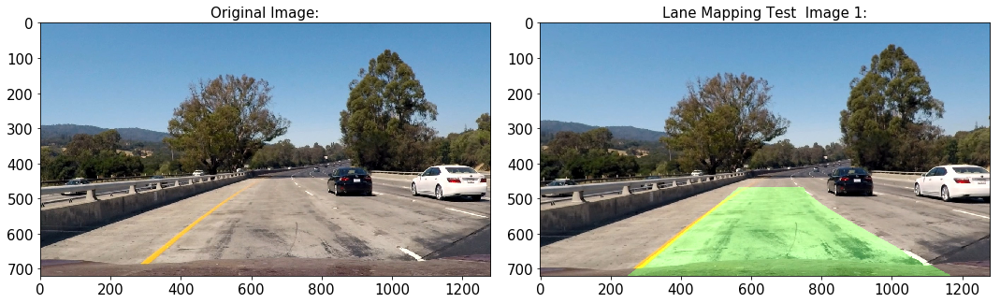

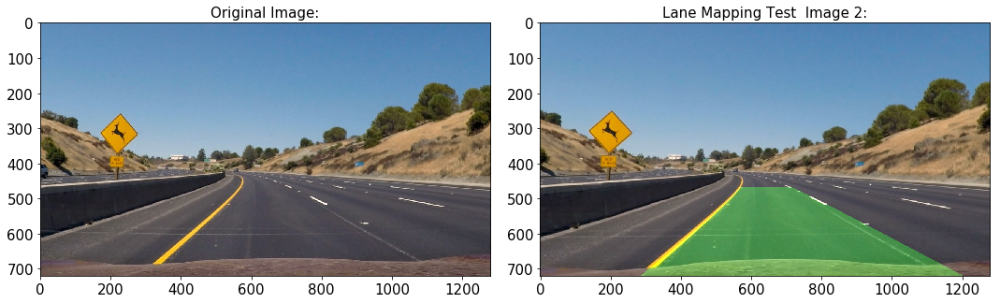

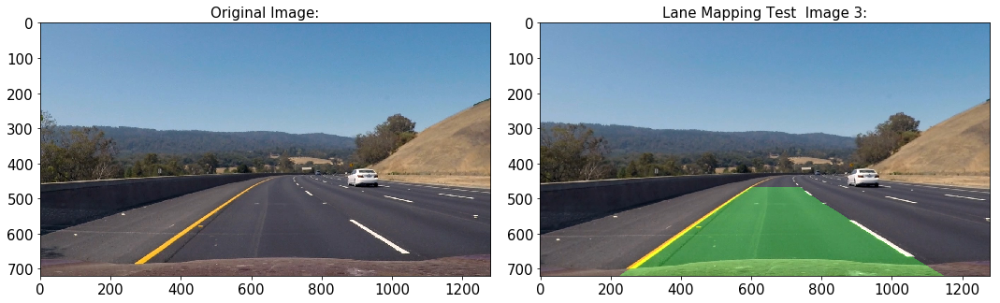

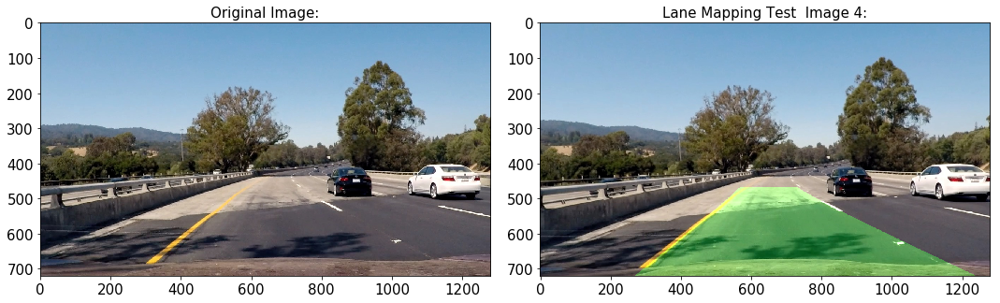

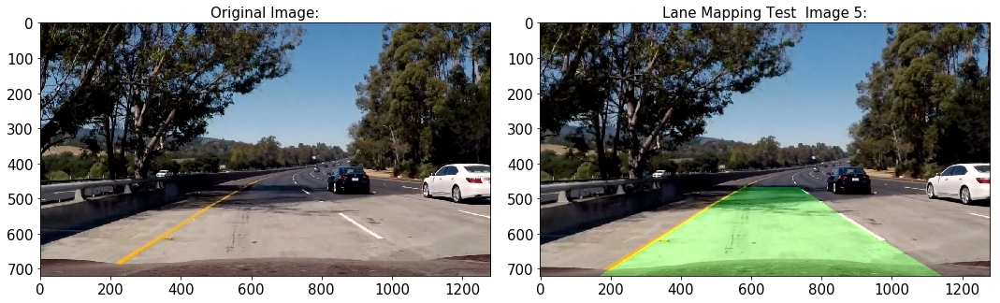

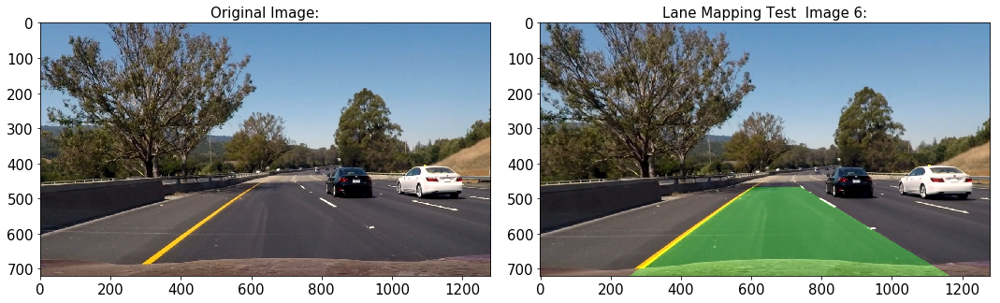

In [18]:
def lane_mapping(img_shape, warped, Minv, ploty, left_fitx, right_fitx, undistorted):
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0)) 
    newwarp = cv2.warpPerspective(color_warp, Minv, (img_shape[1], img_shape[0])) 
    out_img = cv2.addWeighted(undistorted, 1, newwarp, 0.3, 0)
    return out_img


def laneMaping(img_path, op):
    
    test_images = glob.glob(img_path)
    print ('test_images ', len(test_images))
    n = 0
    for img in test_images:
        img = cv2.imread(img)
        test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        undistorted_img = cv2.undistort(img, mtx, dist, None, mtx)
        new_img = combinedThresholds(undistorted_img)
        warped_img, M, Minv = transform_perspective(new_img)
        new_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped_img)
        new_img = lane_mapping(img.shape[:2], warped_img, Minv, ploty, left_fitx, right_fitx, cv2.cvtColor(undistorted_img, cv2.COLOR_BGR2RGB))
        plotter(test_img, new_img, op, n)
        plt.savefig(OUT_IMG_DIR + 'lane_mapping.png'.format(op), bbox_inches="tight")
        n += 1
             
# get mtx and dist
mtx, dist = get_mtx_dist(CAM_IMG_PATH + "camera_cal_img_3.p")

# Test cameraOffset on test images
img_path = TST_IMG_PATH + 'test*.jpg'    
laneMaping(img_path, 'Lane Mapping Test')


The shaded area represents the new region that the next image was searched to find the lane lines. This reduces the need to search through the entire image for the lane lines again. With these fitted lines, we can now work try and figure out the radius of the curvature in the lane, which will ultimately help us figure out how much we need to steer the vehicle.

### display of the lane boundaries and numerical estimation of lane curvature and vehicle position

In [20]:
best_fit_test_images = glob.glob(OUT_IMG_DIR + 'test*_top_view.jpg')
n_frames = 0

def video_pipeline(img):
    global n_frames
    if n_frames == 0:
        undistorted = cv2.undistort(img, mtx, dist, None, mtx)
        binary_thresholded = combinedThresholds(undistorted)
        warped, M, Minv = transform_perspective(binary_thresholded)
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped)   
        left_curverad, right_curverad = roc_in_meters(ploty, left_fit, right_fit, leftx, rightx)
        camera = offset(img.shape[1]/2, leftx_base, rightx_base)
        out_img = lane_mapping(img.shape[:2], warped, Minv, ploty, left_fitx, right_fitx, undistorted)
        annotate(out_img, left_curverad, right_curverad, camera)
    else:
        undistorted = undistort(img)
        binary_thresholded = combinedThresholds(undistorted)
        region = region_of_interest(binary_thresholded)
        warped, M, Minv = transform_perspective(region)
        binary_warped = warped
        
        if LEFT.detected == True:
            left_fit = LEFT.current_fit_coeffs
        else:
            left_fit = LEFT.best_fit_coeffs
        
        if RIGHT.detected == True:
            right_fit = RIGHT.current_fit_coeffs
        else:
            right_fit = RIGHT.best_fit_coeffs
        
        windows_img, ploty, left_fitx, right_fitx, left_fit, right_fit, leftx, rightx, leftx_base, rightx_base = sliding_windows(warped)   

        if LEFT.detected == True:
            LEFT.recent_xfits.append((left_fitx))
            LEFT.best_xfit = np.mean(LEFT.recent_xfits)
            LEFT.current_fit_coeffs.append((left_fit))
            LEFT.best_fit_coeffs = np.mean(LEFT.current_fit_coeffs)
            LEFT.line_base_position = leftx_current
            LEFT.allx = leftx
            LEFT.ally = lefty
        else:
            left_fitx = LEFT.best_xfit
            left_fit = LEFT.best_fit_coeffs
            leftx_current = LEFT.line_base_position
            leftx = LEFT.allx
            lefty = LEFT.ally   
        if RIGHT.detected == True:
            RIGHT.recent_xfits.append((right_fitx))
            RIGHT.best_xfit = np.mean(RIGHT.recent_xfits)
            RIGHT.current_fit_coeffs.append((right_fit))
            RIGHT.best_fit_coeffs = np.mean(RIGHT.current_fit_coeffs)
            RIGHT.line_base_position = rightx_current
            RIGHT.allx = rightx
            RIGHT.ally = righty   
        else:
            right_fitx = RIGHT.best_xfit
            right_fit = RIGHT.best_fit_coeffs
            rightx_current = RIGHT.line_base_position
            rightx = RIGHT.allx
            righty = RIGHT.ally
            
        is_lane_width_correct = verify_lane_width(LEFT.line_base_position, RIGHT.line_base_position)
        if is_lane_width_correct == True:
            LEFT.detected = True
            RIGHT.detected = True
        else:
            LEFT.detected = False
            RIGHT.detected = False
                
        left_curverad, right_curverad =  roc_in_meters(ploty, left_fit, right_fit, leftx, rightx)
        LEFT.radius_of_curvature = left_curverad
        RIGHT.radius_of_curvature = right_curverad
        
        leftx_base = leftx_current
        rightx_base = rightx_current
        camera = offset(img.shape[1]/2, leftx_base, rightx_base, n_frames)
        
        out_img = lane_mapping(img.shape[:2], warped, Minv, ploty, left_fitx, right_fitx, undistorted)
        annotate(out_img, left_curverad, right_curverad, camera)    
    return out_img

## Test the complete flow with pipeline

/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:8: RankWarning: Polyfit may be poorly conditioned
  
/Users/gangadharkadam/anaconda/envs/carnd-term1/lib/python3.5/site-packages/ipykernel_launcher.py:9: RankWarning: Polyfit may be poorly conditioned
  if __name__ == '__main__':


Text(0.5,1,'Test 1 Output:')

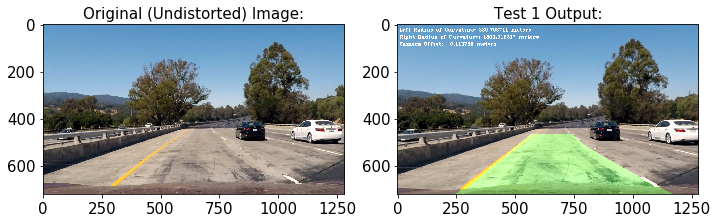

In [21]:
img = cv2.imread(TST_IMG_PATH + 'test1.jpg')
out_img = video_pipeline(img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
f.tight_layout()
matplotlib.rc('xtick', labelsize=15) 
matplotlib.rc('ytick', labelsize=15)
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title('Original (Undistorted) Image:', fontsize=15)
ax2.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB), cmap='gray')
ax2.set_title('Test 1 Output:', fontsize=15)

In [22]:
from moviepy.editor import VideoFileClip

video_output = 'project_video_output.mp4'
clip = VideoFileClip('project_video.mp4')

output_clip = clip.fl_image(video_pipeline)
%time output_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [06:00<00:00,  3.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 49s, sys: 1min 11s, total: 7min 1s
Wall time: 6min 2s


In [66]:
import imageio
import os, sys

class TargetFormat(object):
    GIF = ".gif"
    MP4 = ".mp4"
    AVI = ".avi"

def convertFile(inputpath, targetFormat):
    """Reference: http://imageio.readthedocs.io/en/latest/examples.html#convert-a-movie"""
    outputpath = os.path.splitext(inputpath)[0] + targetFormat
    print("converting\r\n\t{0}\r\nto\r\n\t{1}".format(inputpath, outputpath))

    reader = imageio.get_reader(inputpath)
    fps = reader.get_meta_data()['fps']

    writer = imageio.get_writer(outputpath, fps=fps)
    for i,im in enumerate(reader):
        sys.stdout.write("\rframe {0}".format(i))
        sys.stdout.flush()
        writer.append_data(im)
    print("\r\nFinalizing...")
    writer.close()
    print("Done.")

convertFile("project_video_output.mp4", TargetFormat.GIF)

converting
	project_video_output.mp4
to
	project_video_output.gif
frame 1259
Finalizing...
Done.
